In [1]:
import os
import csv
from collections import defaultdict

In [2]:
# Sensor ID to Name Mapping
SENSOR_MAPPING = {
    "1": "LT",
    "2": "RT",
    "3": "LS",
    "4": "RS",
    "5": "LA",
    "6": "RA"
}

def separate_data_by_sensor(input_filename, output_directory):
    """
    Reads the input CSV file, separates data by SensorID, and saves them in the specified output directory
    using the defined sensor name mapping.
    """
    os.makedirs(output_directory, exist_ok=True)  # Ensure output directory exists

    sensor_data = defaultdict(list)

    with open(input_filename, "r") as file:
        reader = csv.reader(file)
        header = next(reader)  # Read the header row

        # Process each row in the file
        for row in reader:
            if not row or all(cell.strip() == "" for cell in row):
                continue  # Skip empty rows

            sensor_id = row[1]  # Assuming SensorID is in the second column (index 1)
            sensor_name = SENSOR_MAPPING.get(sensor_id, f"sensor_{sensor_id}")  # Default if unknown

            sensor_data[sensor_name].append(row)

    # Write data for each sensor into separate CSV files
    for sensor_name, rows in sensor_data.items():
        output_filename = os.path.join(output_directory, f"{sensor_name}.csv")
        with open(output_filename, "w", newline="") as out_file:
            writer = csv.writer(out_file)
            writer.writerow(header)  # Write the header first
            writer.writerows(rows)
        print(f"Data for {sensor_name} written to {output_filename}")

def process_patient_data(root_directory, output_root):
    """
    Iterates through patient directories and processes each CSV file.
    """
    for patient in os.listdir(root_directory):
        patient_path = os.path.join(root_directory, patient)
        if not os.path.isdir(patient_path):  # Skip non-directory files
            continue

        patient_output_dir = os.path.join(output_root, patient)
        os.makedirs(patient_output_dir, exist_ok=True)

        for test_file in os.listdir(patient_path):
            if test_file.endswith(".csv"):
                test_name = test_file.replace(".csv", "")  # Extract test name
                test_output_dir = os.path.join(patient_output_dir, test_name)
                os.makedirs(test_output_dir, exist_ok=True)

                input_file_path = os.path.join(patient_path, test_file)
                separate_data_by_sensor(input_file_path, test_output_dir)

if __name__ == "__main__":
    input_root = "./dataset_new"
    output_root = "./dataset_formatted"
    
    process_patient_data(input_root, output_root)
    print("Processing complete.")


Data for LT written to ./dataset_formatted/patient1/test4/LT.csv
Data for RT written to ./dataset_formatted/patient1/test4/RT.csv
Data for LS written to ./dataset_formatted/patient1/test4/LS.csv
Data for RS written to ./dataset_formatted/patient1/test4/RS.csv
Data for LA written to ./dataset_formatted/patient1/test4/LA.csv
Data for RA written to ./dataset_formatted/patient1/test4/RA.csv
Data for LT written to ./dataset_formatted/patient1/test5/LT.csv
Data for RT written to ./dataset_formatted/patient1/test5/RT.csv
Data for LS written to ./dataset_formatted/patient1/test5/LS.csv
Data for RS written to ./dataset_formatted/patient1/test5/RS.csv
Data for LA written to ./dataset_formatted/patient1/test5/LA.csv
Data for RA written to ./dataset_formatted/patient1/test5/RA.csv
Data for LT written to ./dataset_formatted/patient1/test7/LT.csv
Data for RT written to ./dataset_formatted/patient1/test7/RT.csv
Data for LS written to ./dataset_formatted/patient1/test7/LS.csv
Data for RS written to ./

In [3]:
import os
import pandas as pd

# Sensor ID to Joint Name Mapping
SENSOR_MAPPING = {
    "LT": "LT",
    "RT": "RT",
    "LS": "LS",
    "RS": "RS",
    "LA": "LA",
    "RA": "RA"
}

SENSOR_MAPPING_NUM= {
    "1": "LT",
    "2": "RT",
    "3": "LS",
    "4": "RS",
    "5": "LA",
    "6": "RA"
}

def process_test_data(root_directory, output_root):
    """
    Processes each test for every patient and saves the concatenated dataset in the format:
    dataset_final/patient_name/test#.csv
    """
    for patient in os.listdir(root_directory):
        patient_path = os.path.join(root_directory, patient)
        if not os.path.isdir(patient_path):  # Skip non-directory files
            continue

        patient_output_dir = os.path.join(output_root, patient)
        os.makedirs(patient_output_dir, exist_ok=True)  # Create patient directory if not exists

        for test in os.listdir(patient_path):
            test_path = os.path.join(patient_path, test)
            if not os.path.isdir(test_path):
                continue

            all_sensor_data = []  # List to hold data from all sensors

            for sensor_file in os.listdir(test_path):
                sensor_path = os.path.join(test_path, sensor_file)
                sensor_name = os.path.splitext(sensor_file)[0]  # Extract sensor name (LT, RT, etc.)

                if sensor_name not in SENSOR_MAPPING and sensor_name not in SENSOR_MAPPING_NUM:
                    continue  # Skip unrecognized sensors

                # Read CSV file
                df = pd.read_csv(sensor_path)

                # Drop 'Time(ms)' and 'SensorID'
                df = df.iloc[:, 2:]  # Drop first two columns

                # Rename columns with joint name
                if sensor_name in SENSOR_MAPPING:
                    df.columns = [f"{SENSOR_MAPPING[sensor_name]}_{col}" for col in df.columns]
                elif sensor_name[-1] in SENSOR_MAPPING_NUM:
                    df.columns = [f"{SENSOR_MAPPING_NUM[sensor_name]}_{col}" for col in df.columns]

                all_sensor_data.append(df)

            # Concatenate all sensor data horizontally
            if all_sensor_data:
                concatenated_df = pd.concat(all_sensor_data, axis=1)
                output_filename = os.path.join(patient_output_dir, f"{test}.csv")

                # Save the final concatenated dataset for this patient & test
                concatenated_df.to_csv(output_filename, index=False)
                print(f"Created {output_filename}")

if __name__ == "__main__":
    input_root = "./dataset_formatted"
    output_root = "./dataset_final"

    process_test_data(input_root, output_root)
    print("Processing complete.")

Created ./dataset_final/patient1/test10.csv
Created ./dataset_final/patient1/test7.csv
Created ./dataset_final/patient1/test4.csv
Created ./dataset_final/patient1/test3.csv
Created ./dataset_final/patient1/test5.csv
Created ./dataset_final/patient0/test10.csv
Created ./dataset_final/patient0/test9.csv
Created ./dataset_final/patient0/test7.csv
Created ./dataset_final/patient0/test6.csv
Created ./dataset_final/patient0/test1.csv
Created ./dataset_final/patient0/test8.csv
Created ./dataset_final/patient0/test4.csv
Created ./dataset_final/patient0/test3.csv
Created ./dataset_final/patient0/test2.csv
Created ./dataset_final/patient0/test5.csv
Created ./dataset_final/abhijtih/test11.csv
Created ./dataset_final/abhijtih/test10.csv
Created ./dataset_final/abhijtih/test9.csv
Created ./dataset_final/abhijtih/test7.csv
Created ./dataset_final/abhijtih/test6.csv
Created ./dataset_final/abhijtih/test8.csv
Created ./dataset_final/abhijtih/test4.csv
Created ./dataset_final/abhijtih/test3.csv
Created

In [3]:
# import os
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# from scipy.stats import iqr, skew, kurtosis
# from sklearn.preprocessing import MinMaxScaler

# # Define dataset paths
# dataset_directory = "./dataset_final"
# output_directory = "./processed_features"

# # Ensure output directory exists
# os.makedirs(output_directory, exist_ok=True)

# # Sensor ID to Joint Name Mapping
# SENSOR_MAPPING = {
#     "LT": "LT",
#     "RT": "RT",
#     "LS": "LS",
#     "RS": "RS",
#     "LA": "LA",
#     "RA": "RA"
# }

# # Feature extraction function
# def extract_features(df):
#     features = {}
#     for joint in SENSOR_MAPPING.values():
#         acc_cols = [f"{joint}_AccelX", f"{joint}_AccelY", f"{joint}_AccelZ"]
#         gyr_cols = [f"{joint}_GyroX", f"{joint}_GyroY", f"{joint}_GyroZ"]

#         # Acceleration and Gyroscope Magnitudes
#         acc_mag = np.sqrt(df[acc_cols[0]]**2 + df[acc_cols[1]]**2 + df[acc_cols[2]]**2)
#         gyr_mag = np.sqrt(df[gyr_cols[0]]**2 + df[gyr_cols[1]]**2 + df[gyr_cols[2]]**2)

#         # Compute statistics for each joint
#         features[f"{joint}_Mean_Gyr"] = np.mean(gyr_mag)
#         features[f"{joint}_Max_Acc"] = np.max(acc_mag)
#         features[f"{joint}_IQR_GyrX"] = iqr(df[gyr_cols[0]])
#         features[f"{joint}_Min_Acc"] = np.min(acc_mag)
#         features[f"{joint}_Mean_AccX"] = np.mean(df[acc_cols[0]])
#         features[f"{joint}_Var_Gyr"] = np.var(gyr_mag)
#         features[f"{joint}_IQR_AccX"] = iqr(df[acc_cols[0]])
#         features[f"{joint}_Std_Gyr"] = np.std(gyr_mag)
#         features[f"{joint}_Skew_Acc"] = skew(acc_mag)
#         features[f"{joint}_Kurt_Gyr"] = kurtosis(gyr_mag)

#     return pd.DataFrame([features])

# # Radar plot function
# def plot_radar(labels, values, title):
#     angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
#     values = np.concatenate((values, [values[0]]))  # Close the circle
#     angles += angles[:1]

#     fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
#     ax.fill(angles, values, color='b', alpha=0.25)
#     ax.plot(angles, values, color='b', linewidth=2)

#     ax.set_yticklabels([])
#     ax.set_xticks(angles[:-1])
#     ax.set_xticklabels(labels, fontsize=10, rotation=45, ha='right')

#     plt.title(title, fontsize=11)
#     plt.show()

# # Iterate through dataset and process each test
# for patient in os.listdir(dataset_directory):
#     patient_path = os.path.join(dataset_directory, patient)
#     if not os.path.isdir(patient_path):
#         continue

#     patient_output_dir = os.path.join(output_directory, patient)
#     os.makedirs(patient_output_dir, exist_ok=True)

#     for test_file in os.listdir(patient_path):
#         test_path = os.path.join(patient_path, test_file)
#         if test_file.endswith(".csv"):
#             # Load dataset
#             df = pd.read_csv(test_path)
            
#             # Handle missing values and normalize
#             df.fillna(method='ffill', inplace=True)
#             scaler = MinMaxScaler()
#             df_scaled = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

#             # Extract features
#             feature_df = extract_features(df_scaled)
#             output_filename = os.path.join(patient_output_dir, f"{test_file}")
            
#             # Save features
#             feature_df.to_csv(output_filename, index=False)
#             print(f"Saved processed features: {output_filename}")

#             # Generate radar plot
#             labels = list(feature_df.columns)
#             values = feature_df.iloc[0].values
#             plot_radar(labels, values, title=f"{patient} - {test_file}")

# print("Processing complete. Radar plots and feature datasets saved.")


/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient1/test4.csv


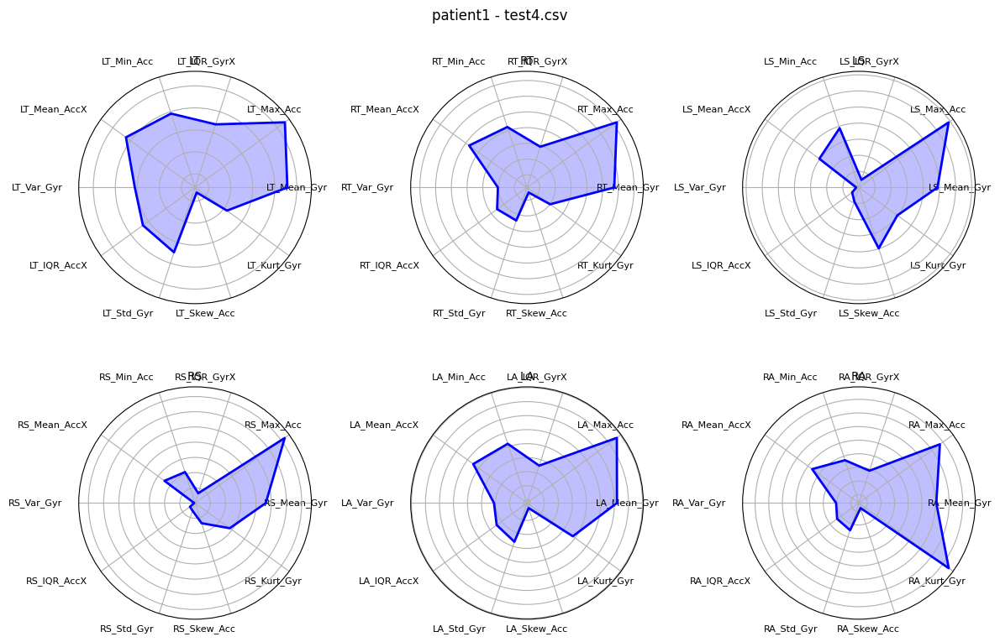

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient1/test5.csv


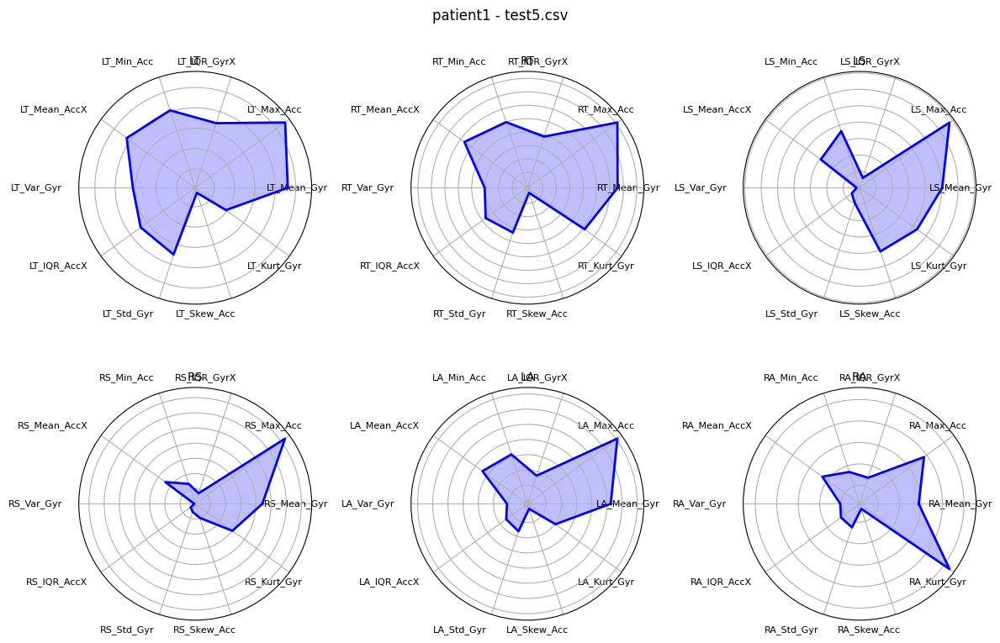

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient1/test7.csv


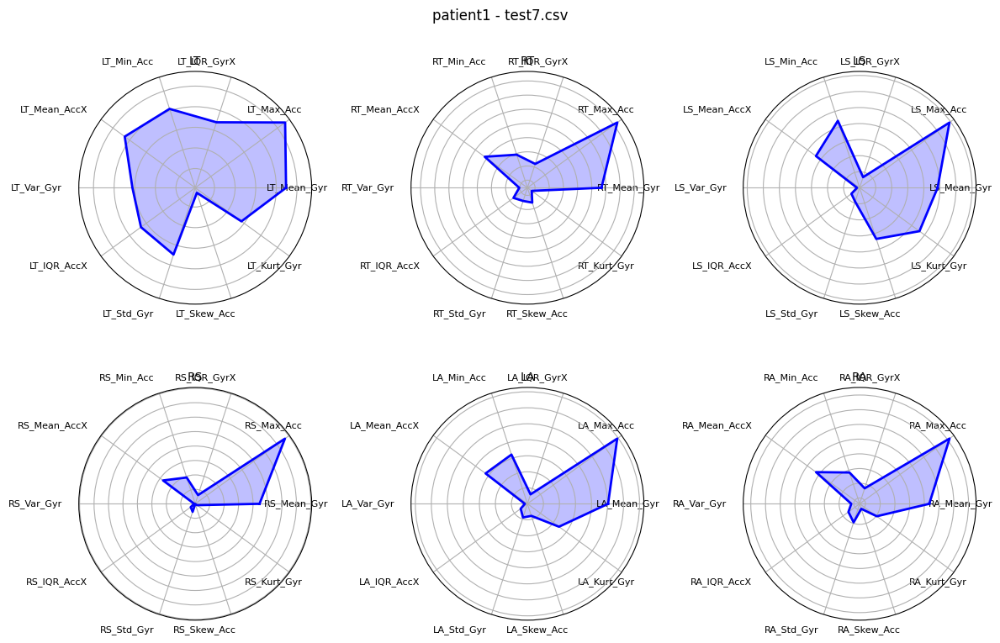

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient1/test3.csv


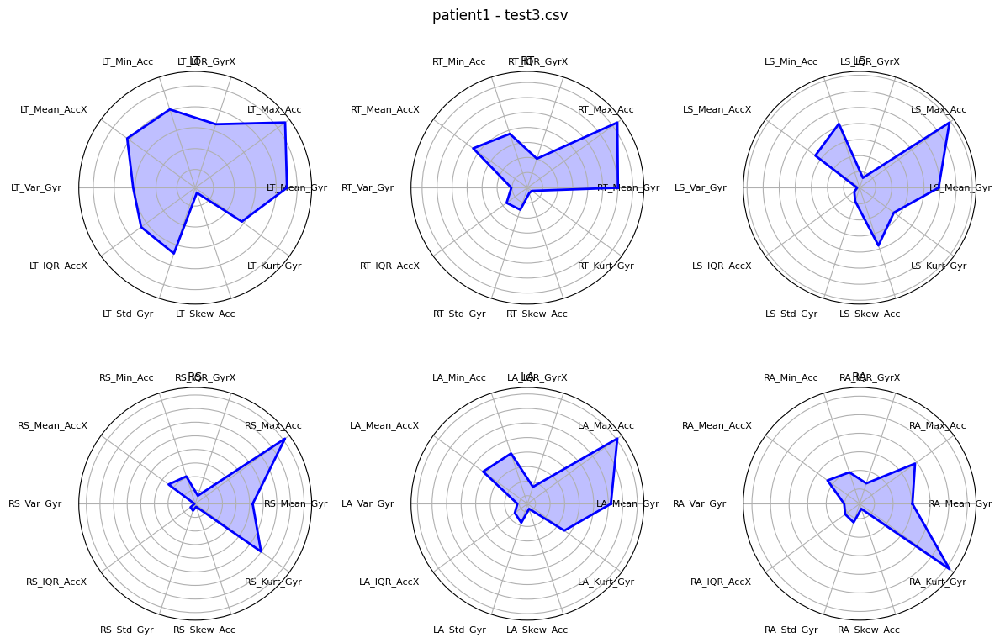

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient1/test10.csv


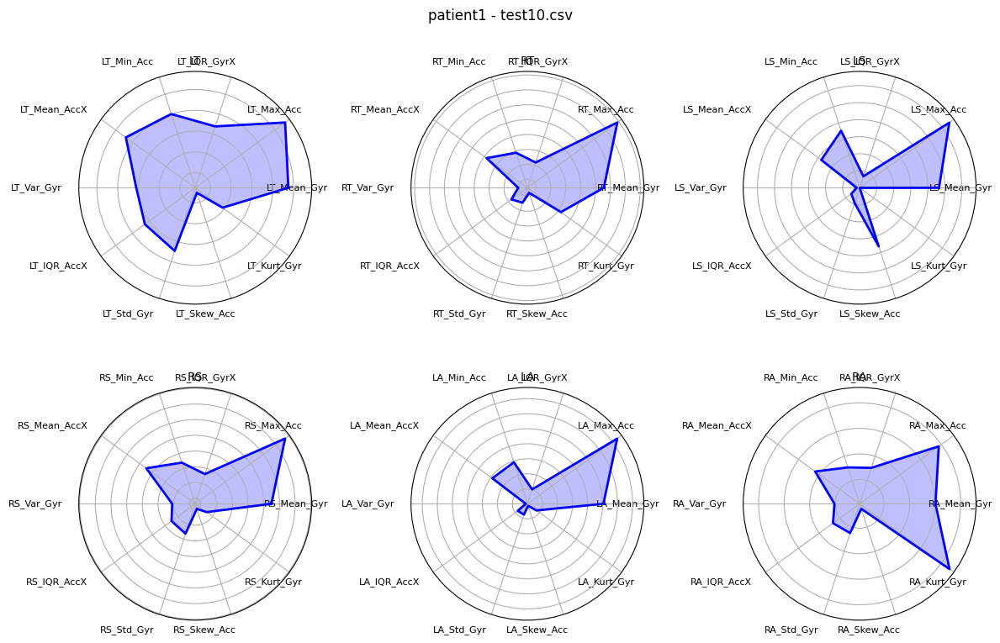

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient0/test8.csv


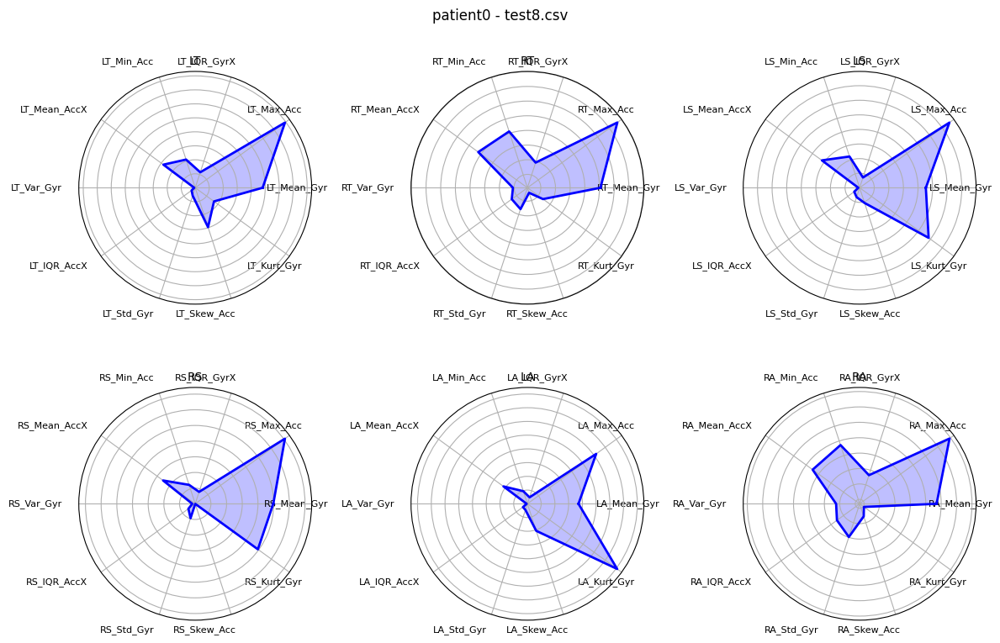

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient0/test9.csv


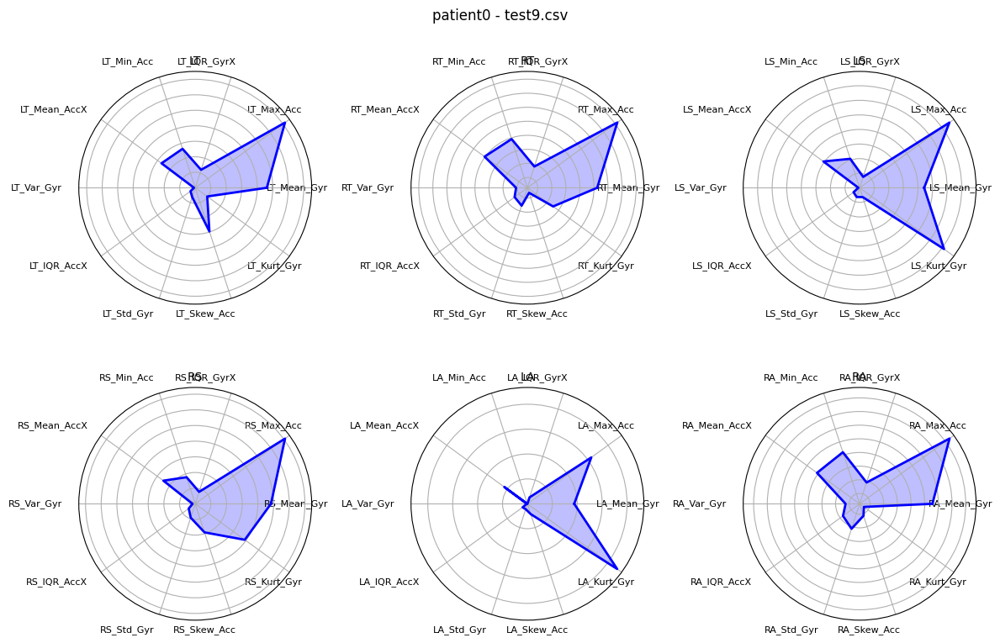

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient0/test4.csv


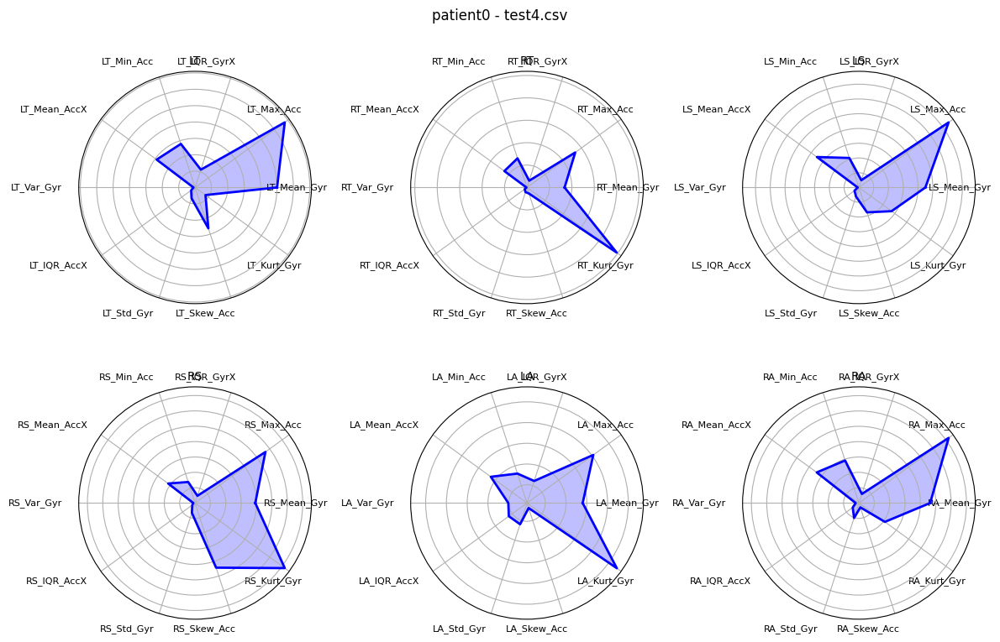

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient0/test5.csv


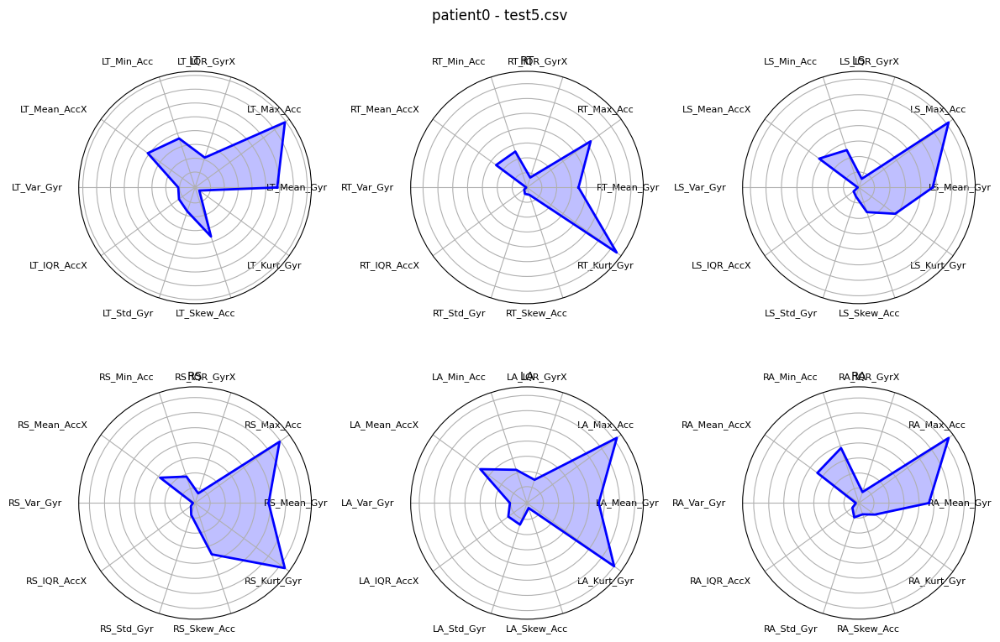

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient0/test7.csv


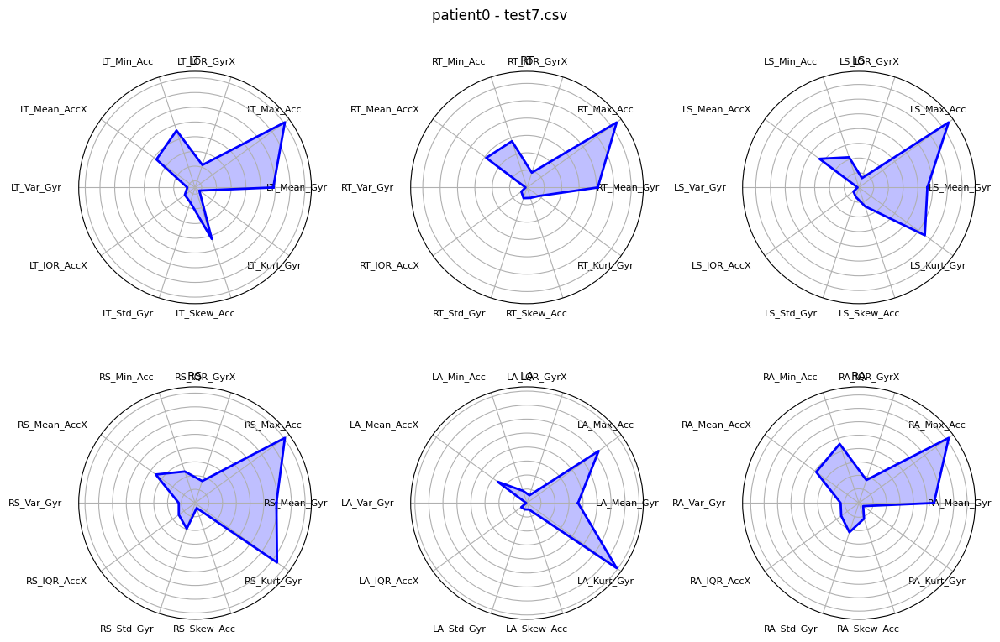

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient0/test6.csv


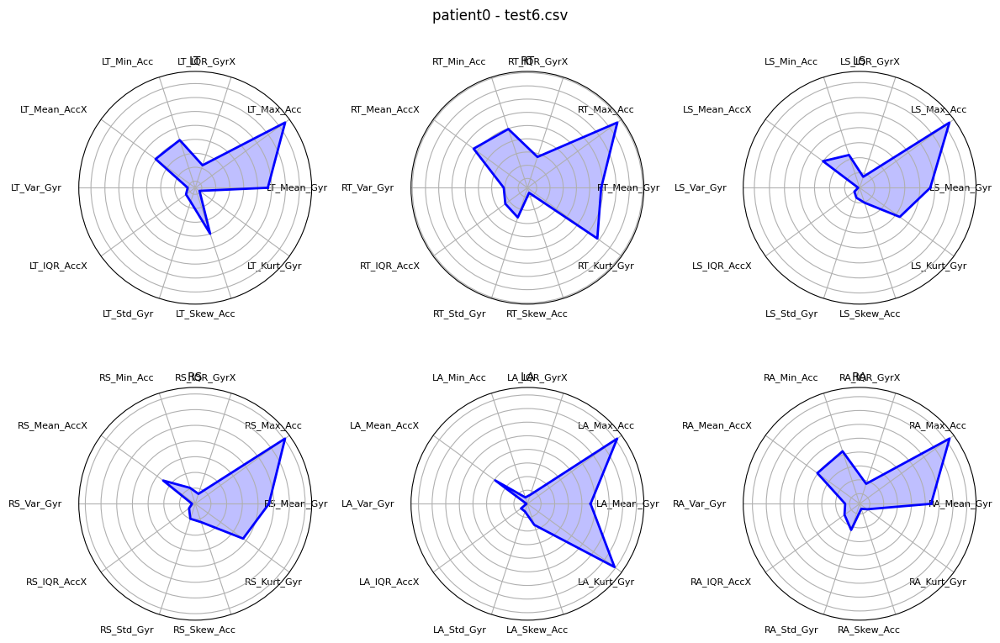

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient0/test2.csv


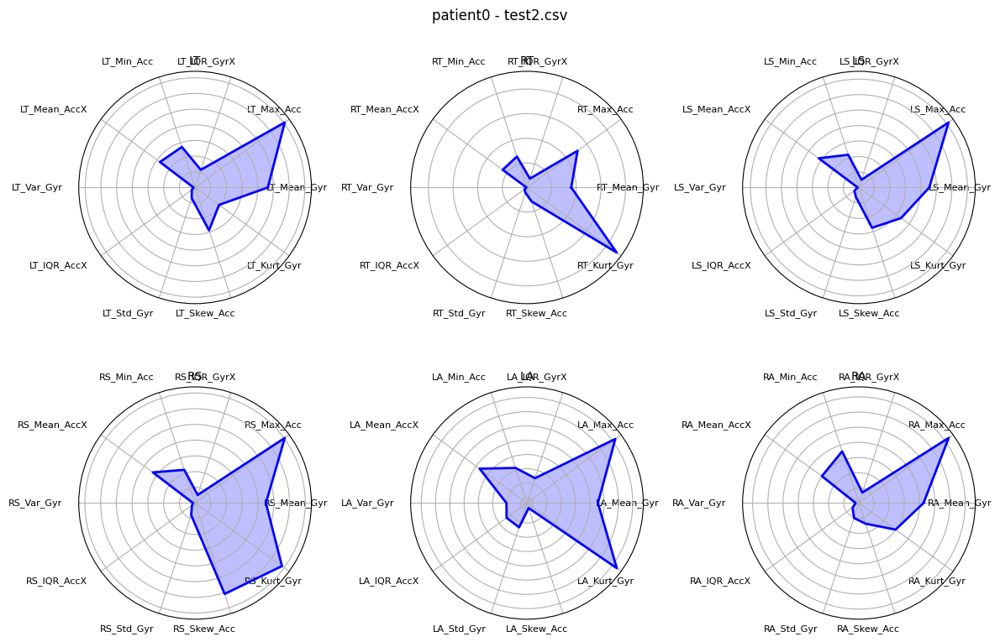

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient0/test3.csv


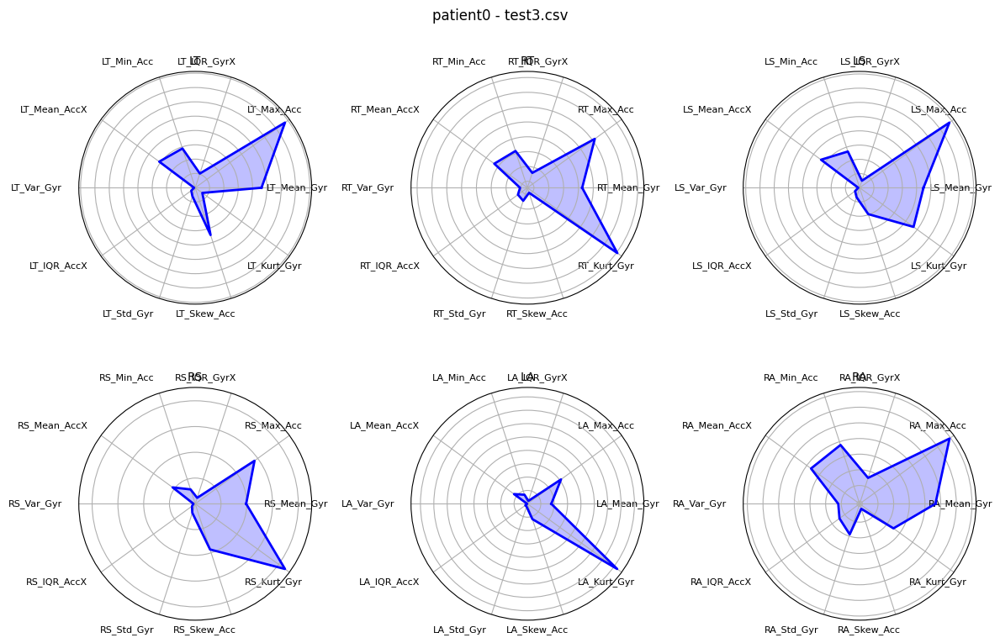

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient0/test1.csv


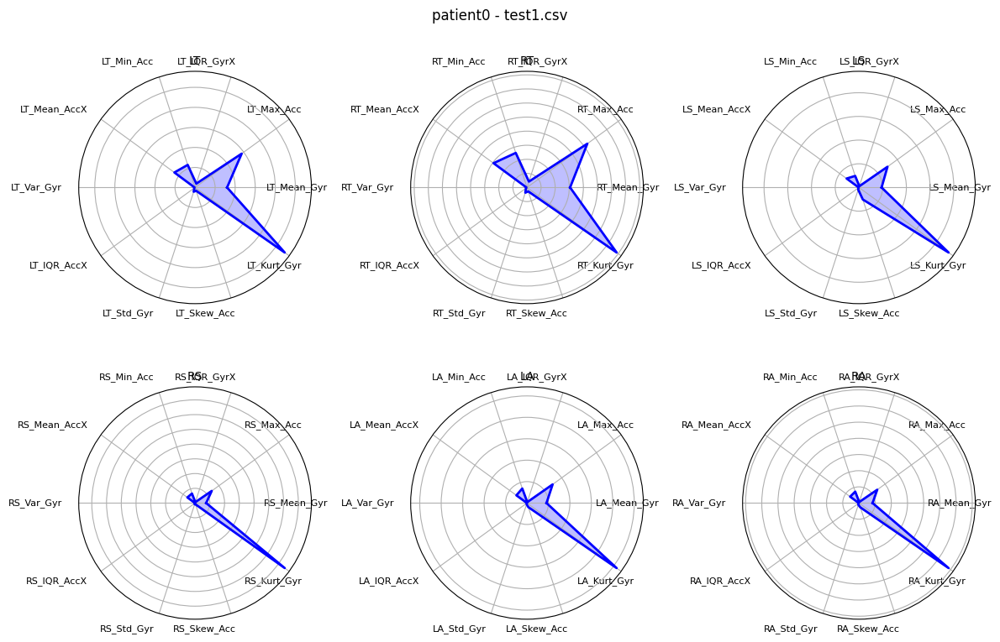

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient0/test10.csv


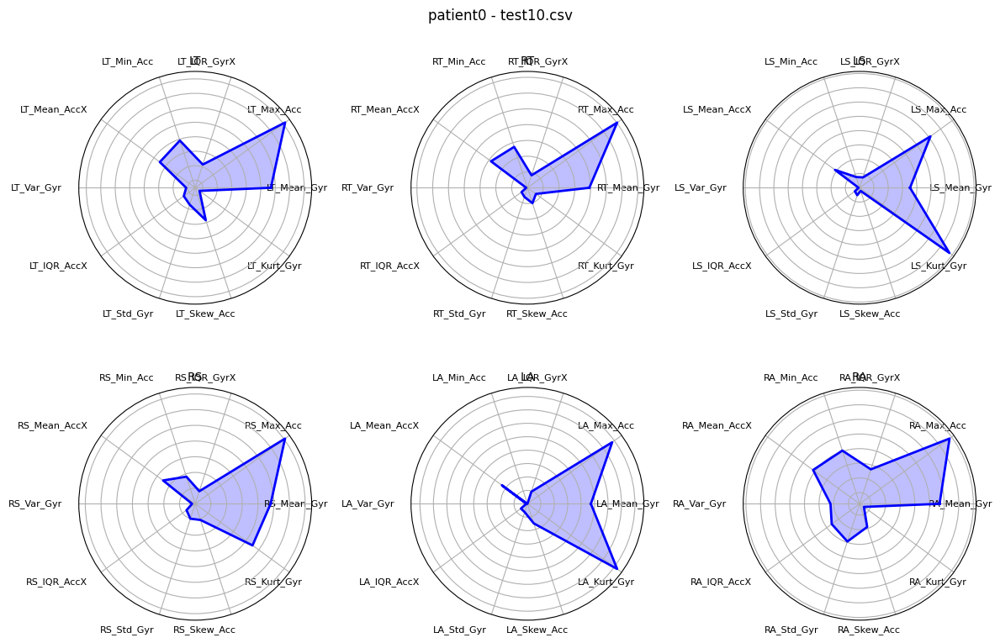

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient2/test8.csv


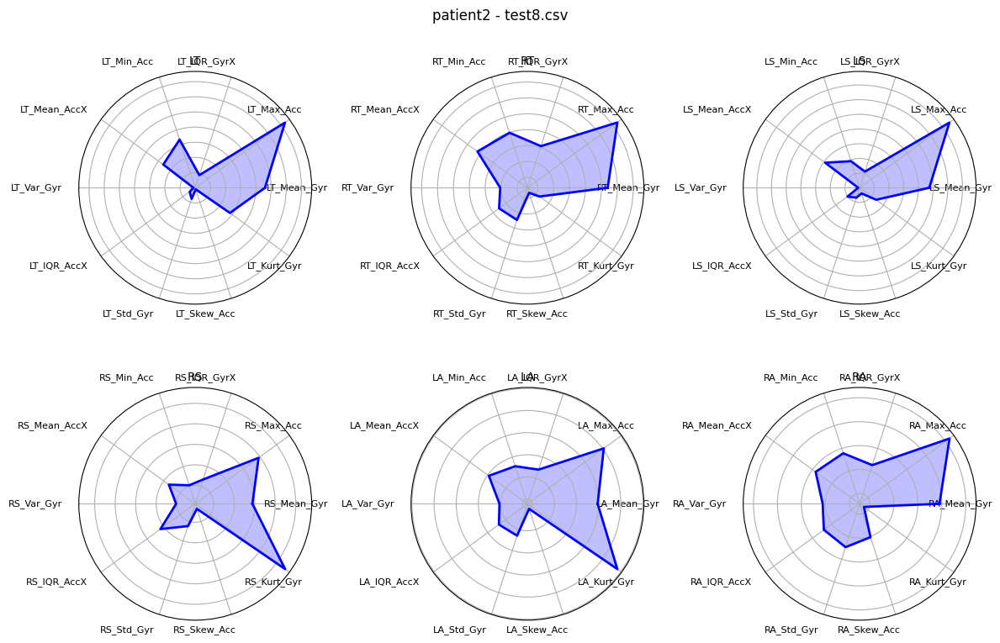

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient2/test4.csv


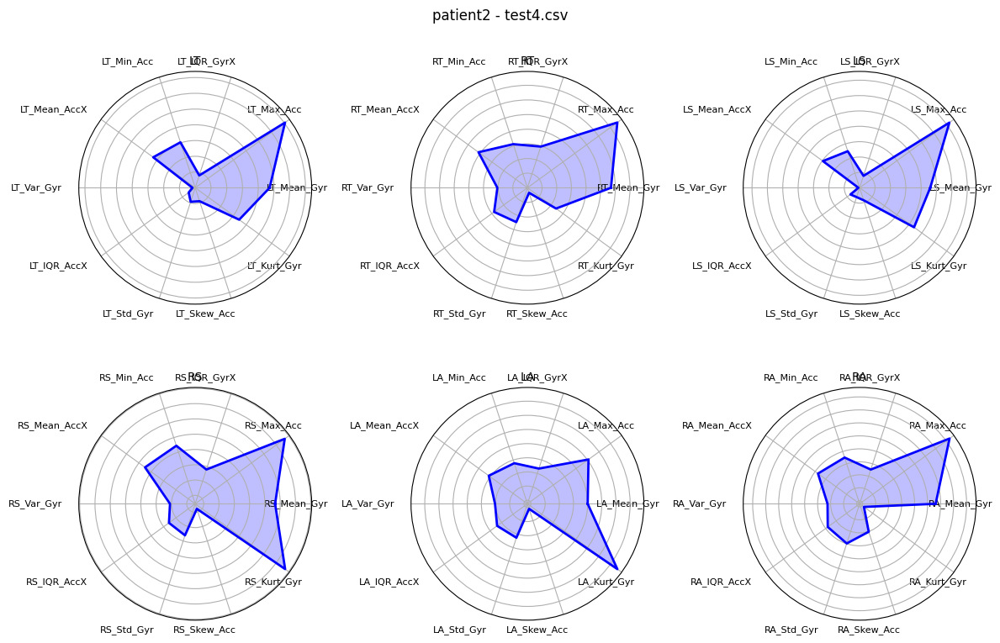

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient2/test5.csv


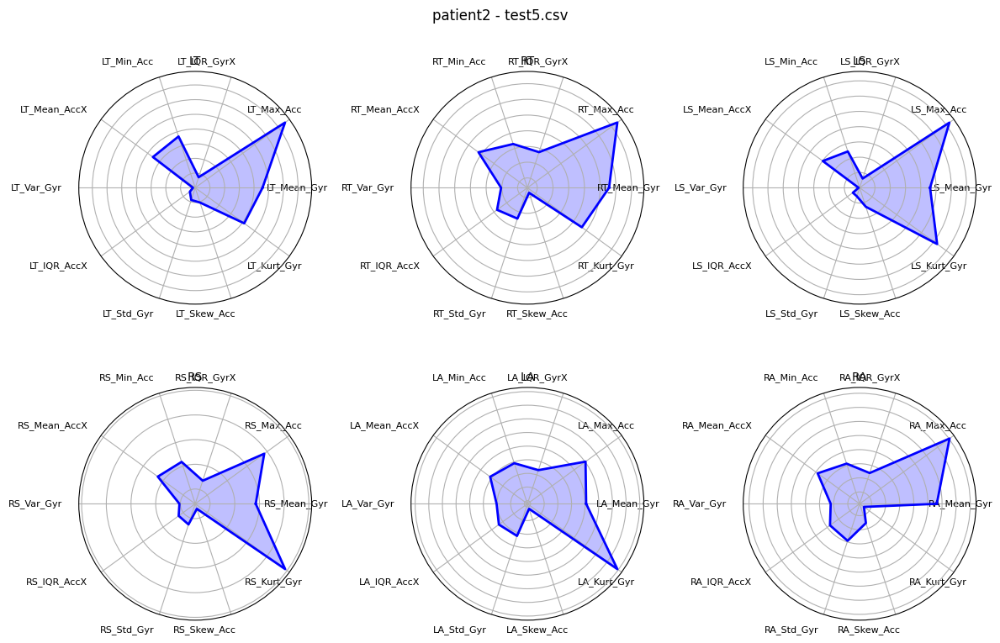

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient2/test6.csv


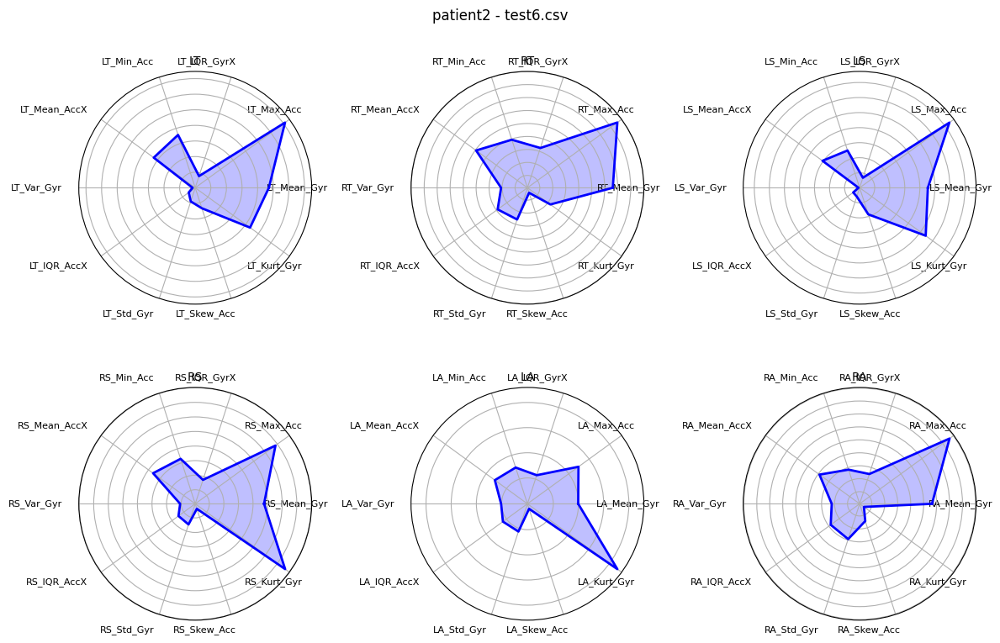

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient2/test2.csv


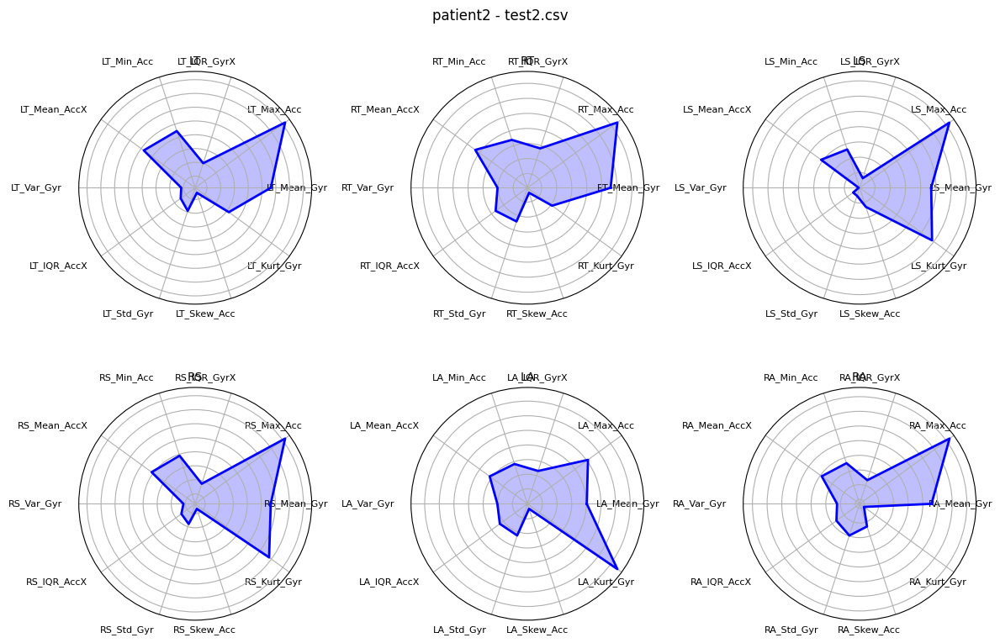

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient2/test3.csv


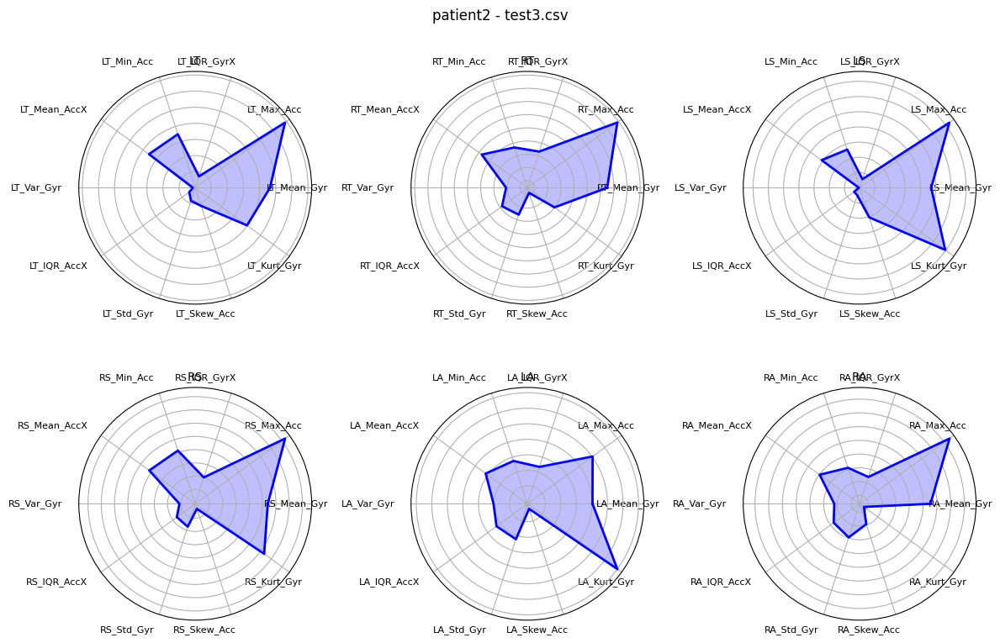

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient2/test1.csv


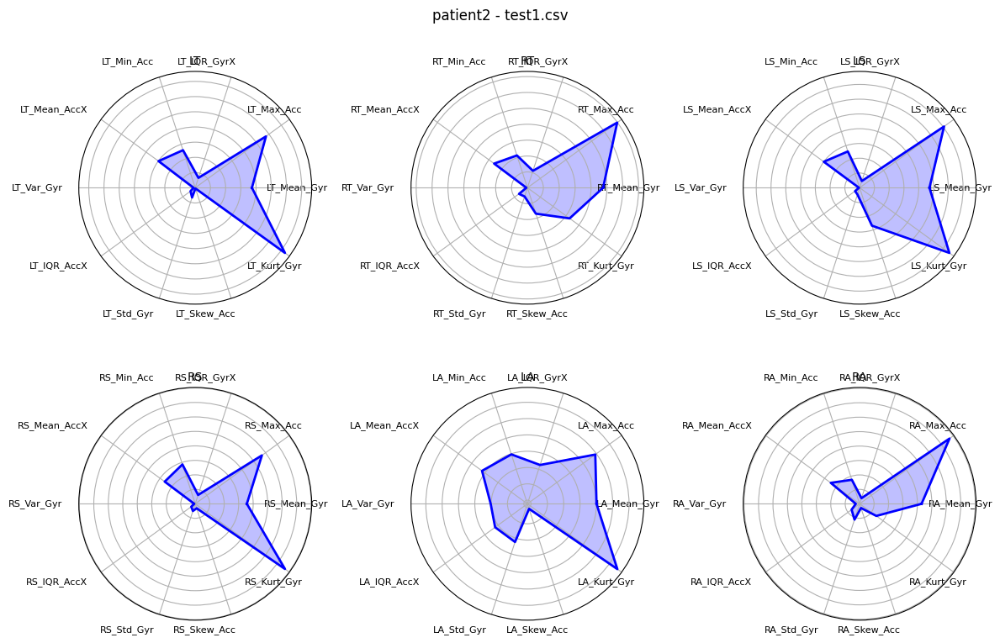

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient3/test8.csv


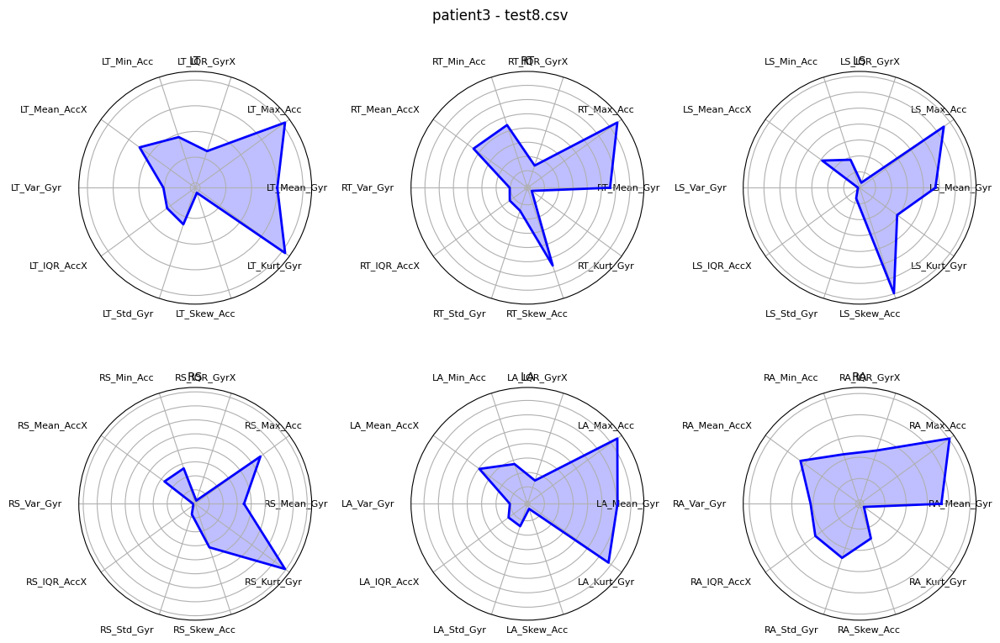

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient3/test9.csv


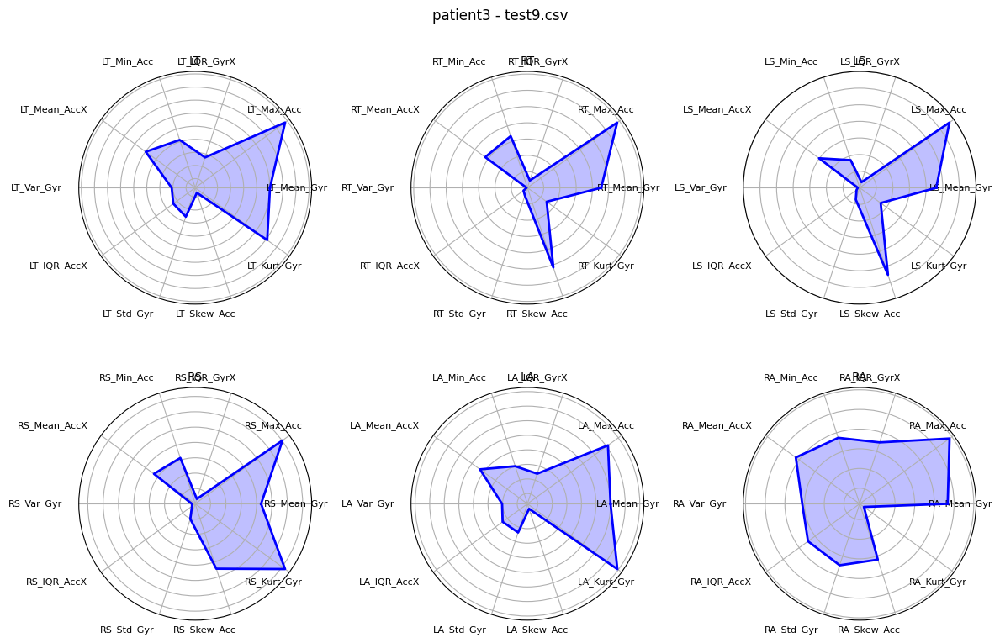

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient3/test4.csv


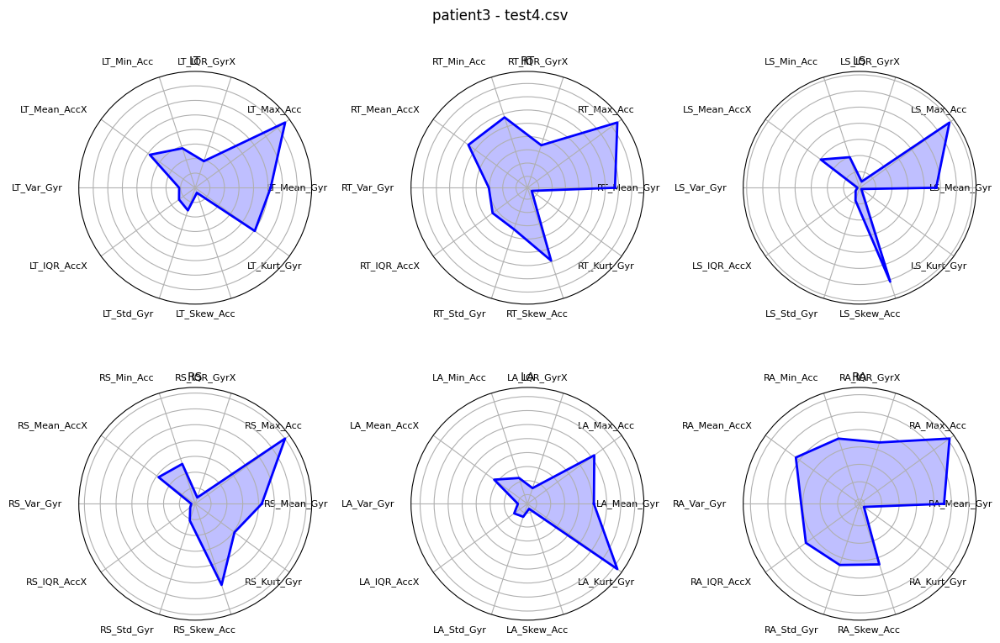

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient3/test5.csv


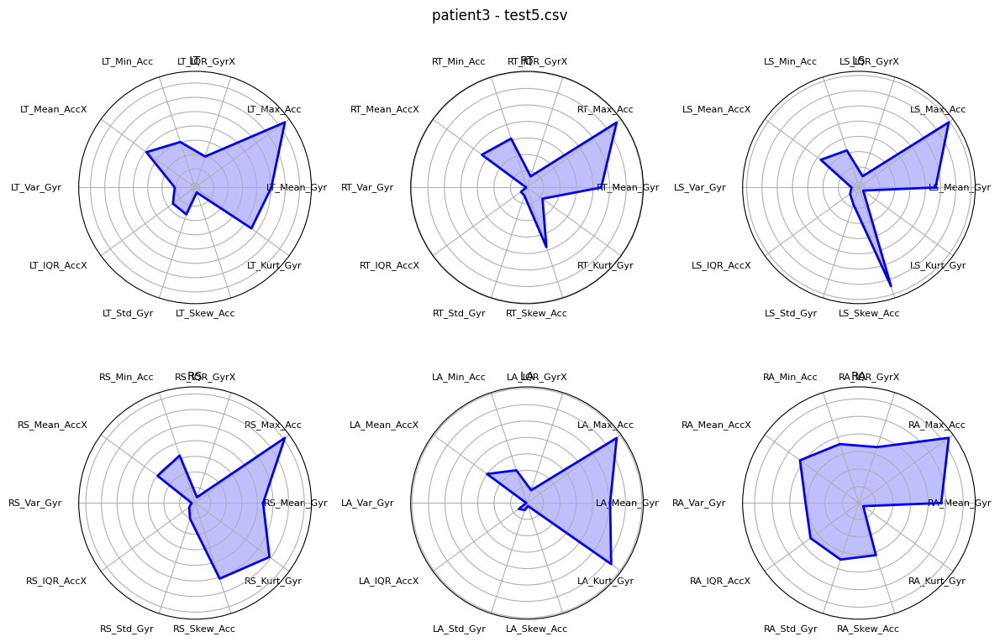

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient3/test7.csv


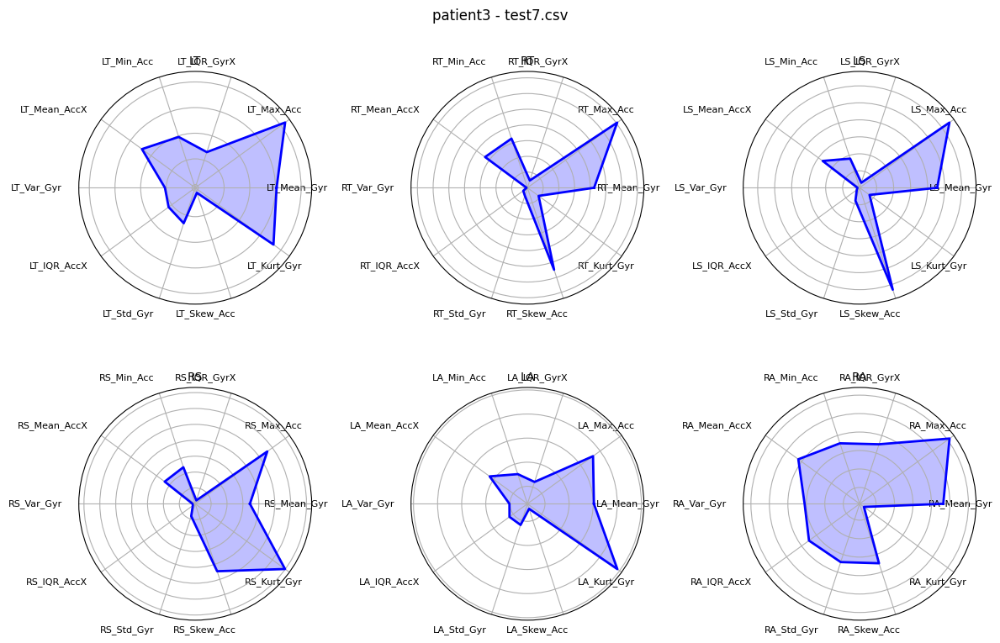

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient3/test6.csv


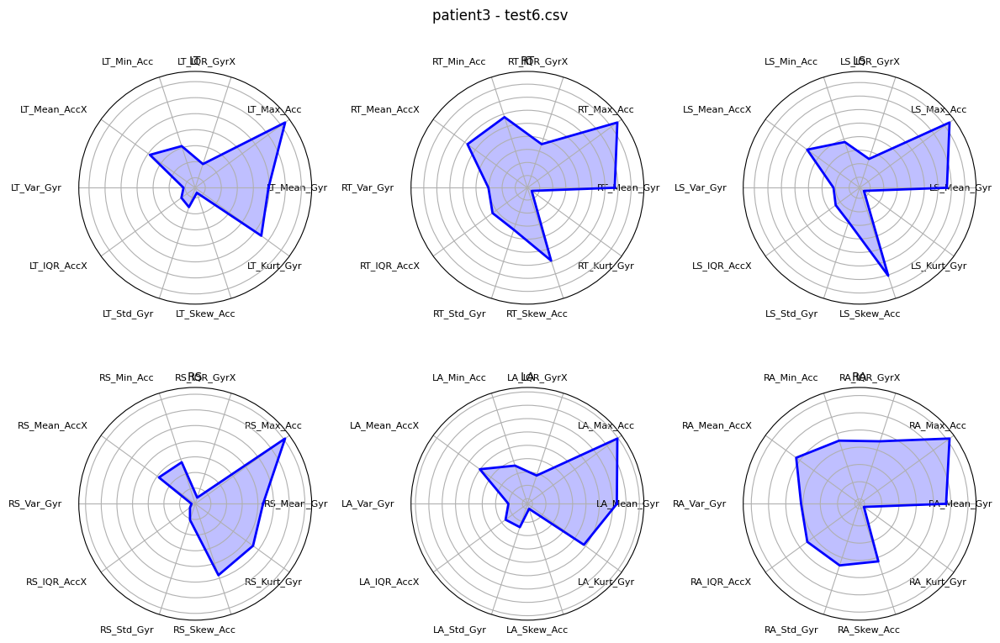

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient3/test3.csv


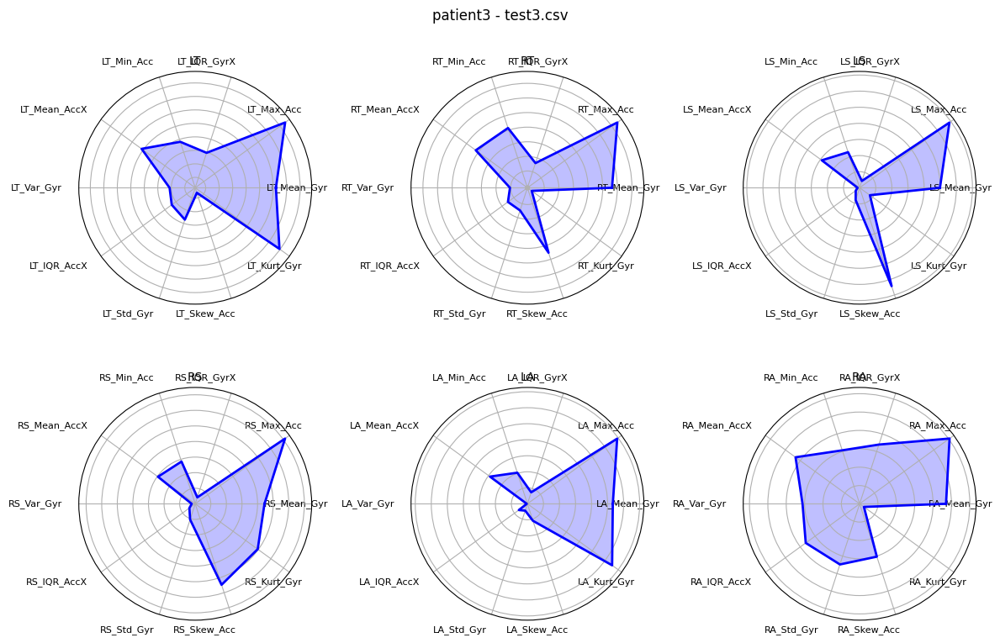

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/patient3/test10.csv


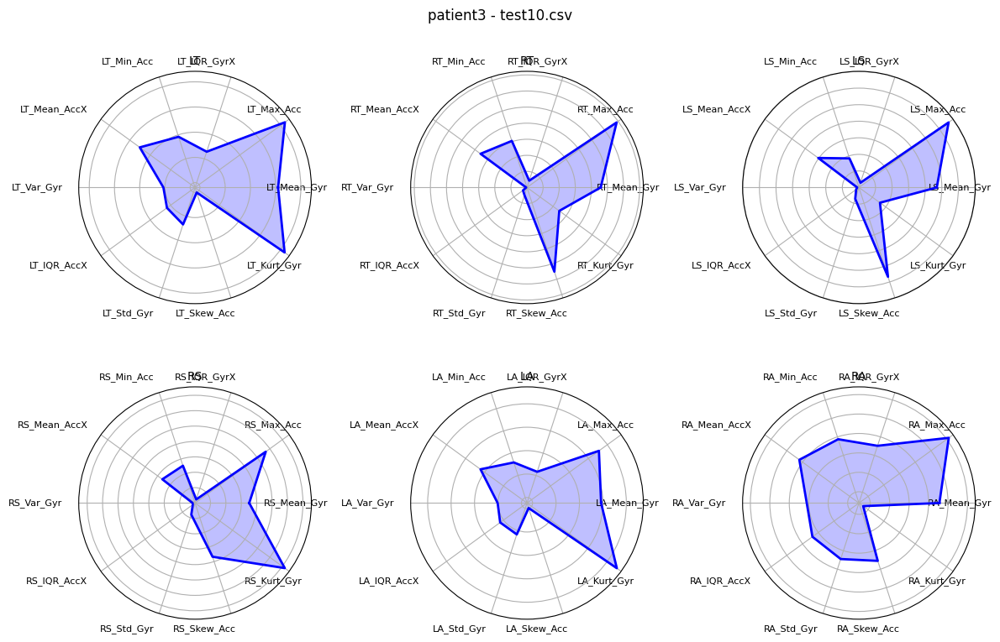

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/anshuman/test4.csv


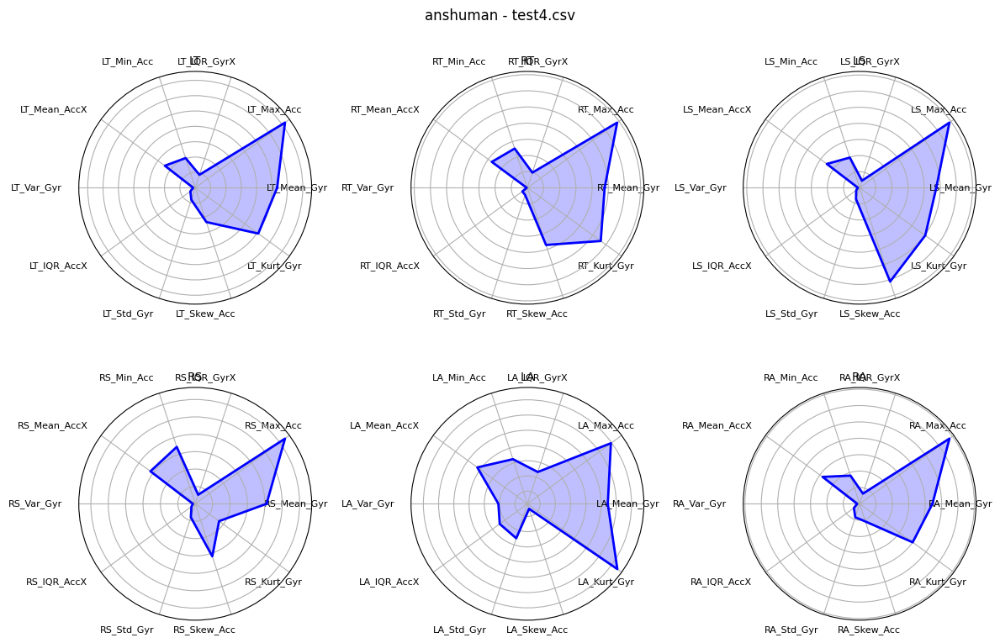

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/anshuman/test5.csv


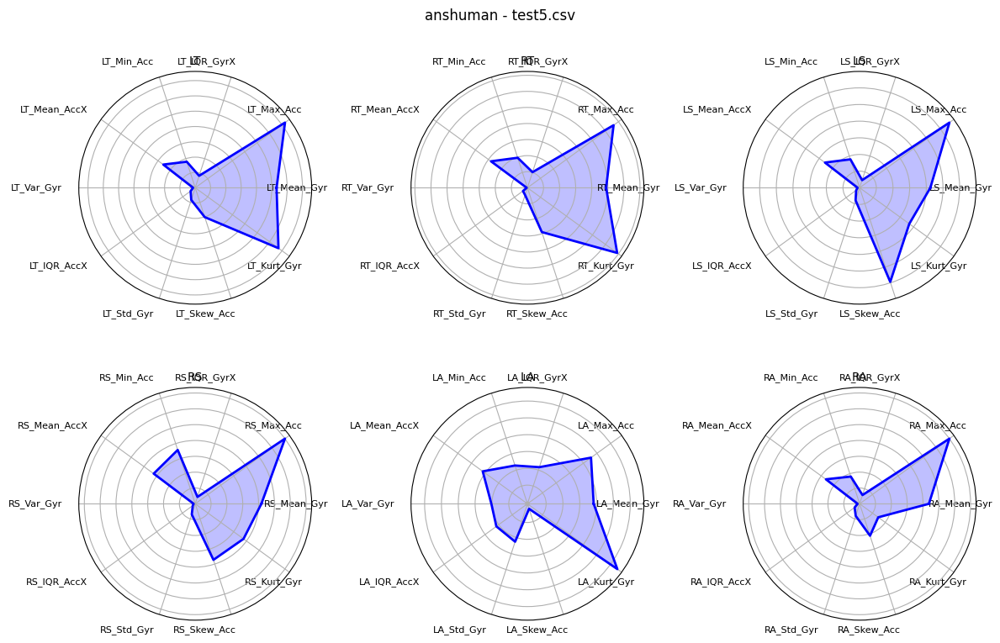

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/anshuman/test6.csv


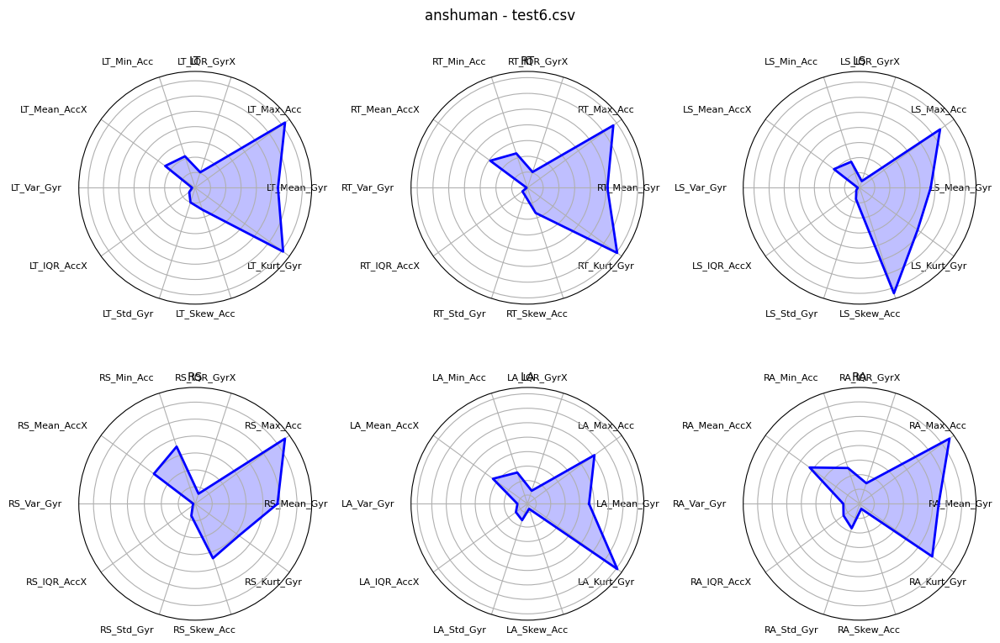

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/anshuman/test2.csv


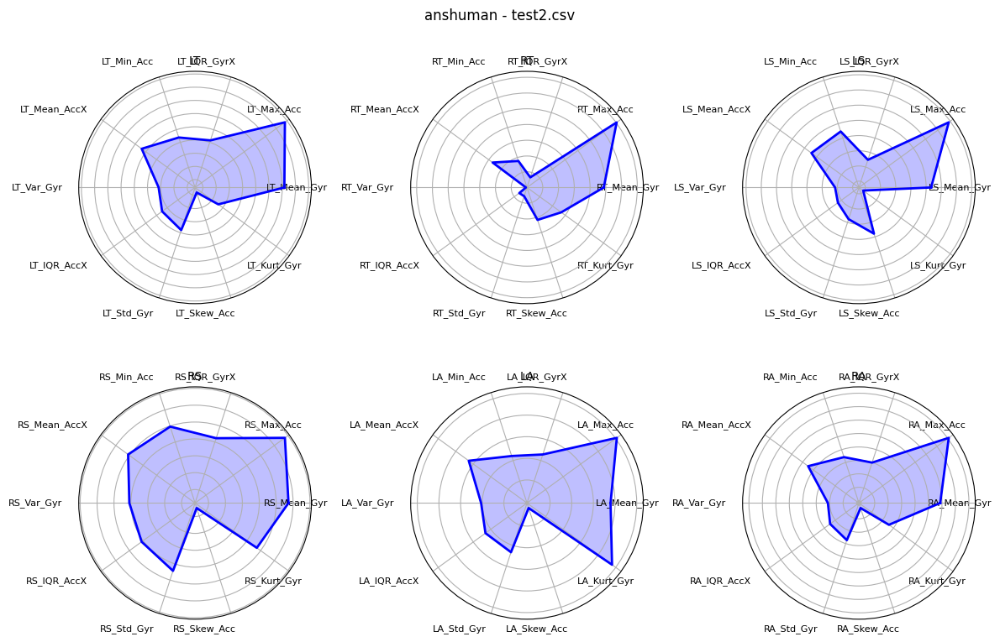

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/anshuman/test3.csv


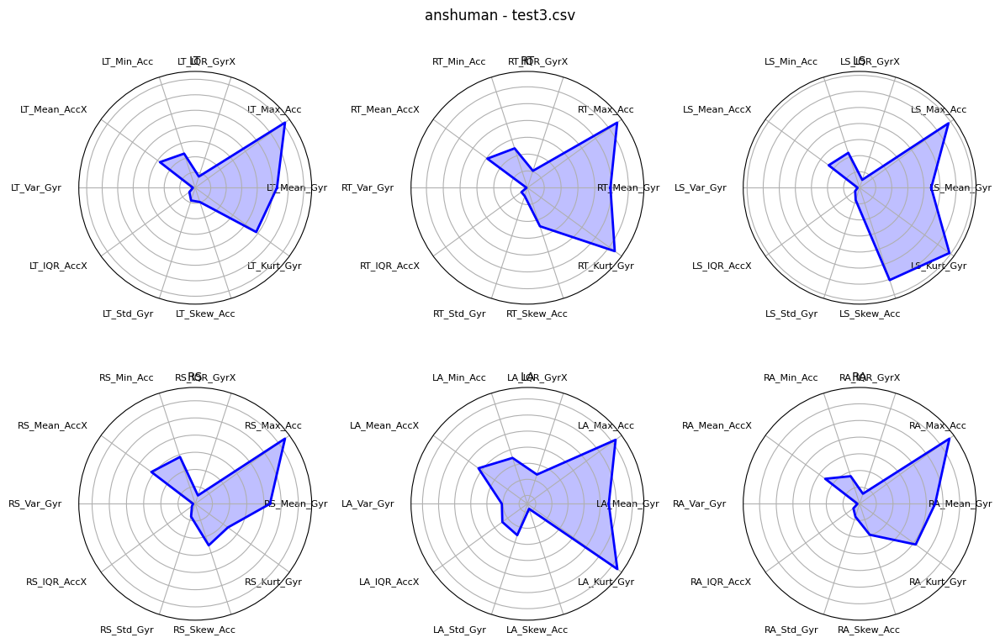

/var/folders/2d/fcgrngd95_b823fdj1fwwj840000gn/T/ipykernel_6131/3015074768.py:101: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Saved processed features: ./processed_features/anshuman/test1.csv


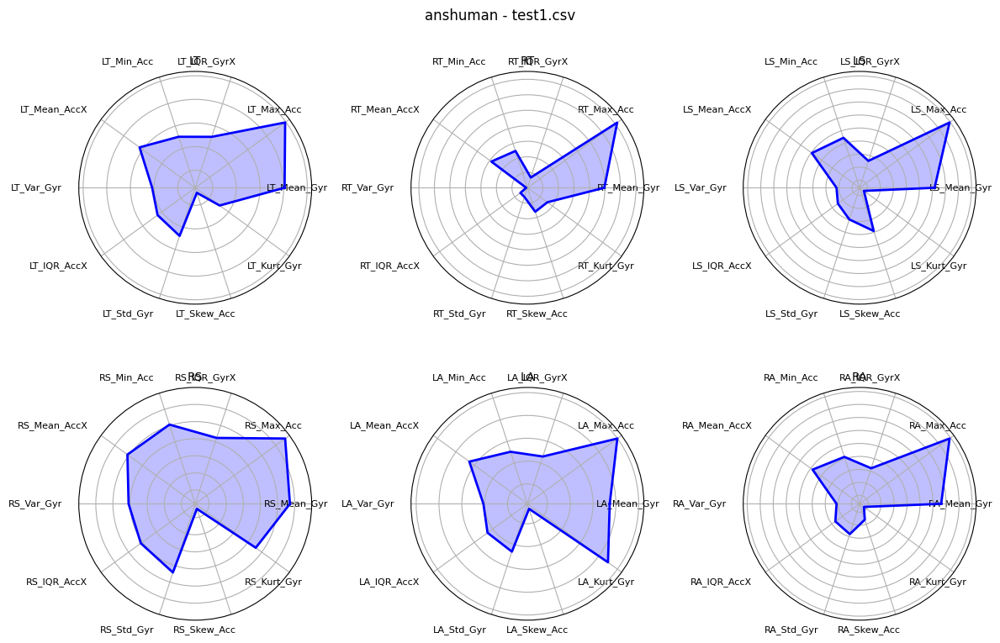

Processing complete. Radar plots and feature datasets saved.


In [7]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import iqr, skew, kurtosis
from sklearn.preprocessing import MinMaxScaler

# Define dataset paths
dataset_directory = "./dataset_final"
output_directory = "./processed_features"

# Ensure output directory exists
os.makedirs(output_directory, exist_ok=True)

# Sensor ID to Joint Name Mapping
SENSOR_MAPPING = {
    "LT": "LT",
    "RT": "RT",
    "LS": "LS",
    "RS": "RS",
    "LA": "LA",
    "RA": "RA"
}

# Feature extraction function
def extract_features(df):
    features = {}
    for joint in SENSOR_MAPPING.values():
        acc_cols = [f"{joint}_AccelX", f"{joint}_AccelY", f"{joint}_AccelZ"]
        gyr_cols = [f"{joint}_GyroX", f"{joint}_GyroY", f"{joint}_GyroZ"]

        # Check if all required columns exist in the DataFrame
        if not all(col in df.columns for col in acc_cols + gyr_cols):
            continue  # Skip if any required column is missing

        # Compute magnitudes
        acc_mag = np.sqrt(df[acc_cols[0]]**2 + df[acc_cols[1]]**2 + df[acc_cols[2]]**2)
        gyr_mag = np.sqrt(df[gyr_cols[0]]**2 + df[gyr_cols[1]]**2 + df[gyr_cols[2]]**2)

        # Compute statistics for each joint
        features[f"{joint}_Mean_Gyr"] = np.mean(gyr_mag)
        features[f"{joint}_Max_Acc"] = np.max(acc_mag)
        features[f"{joint}_IQR_GyrX"] = iqr(df[gyr_cols[0]])
        features[f"{joint}_Min_Acc"] = np.min(acc_mag)
        features[f"{joint}_Mean_AccX"] = np.mean(df[acc_cols[0]])
        features[f"{joint}_Var_Gyr"] = np.var(gyr_mag)
        features[f"{joint}_IQR_AccX"] = iqr(df[acc_cols[0]])
        features[f"{joint}_Std_Gyr"] = np.std(gyr_mag)
        features[f"{joint}_Skew_Acc"] = skew(acc_mag)
        features[f"{joint}_Kurt_Gyr"] = kurtosis(gyr_mag)

    return pd.DataFrame([features])

# Function to generate radar plots for each joint separately
def plot_joint_radar(feature_df, title):
    joints = list(SENSOR_MAPPING.values())
    
    fig, axes = plt.subplots(2, 3, figsize=(12, 8), subplot_kw=dict(polar=True))
    axes = axes.flatten()

    for i, joint in enumerate(joints):
        joint_features = [col for col in feature_df.columns if col.startswith(joint)]
        
        if not joint_features:
            continue  # Skip if no features available

        labels = joint_features
        values = feature_df[joint_features].values.flatten()
        
        angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
        values = np.concatenate((values, [values[0]]))  # Close the circle
        angles += angles[:1]

        axes[i].fill(angles, values, color='b', alpha=0.25)
        axes[i].plot(angles, values, color='b', linewidth=2)
        axes[i].set_xticks(angles[:-1])
        axes[i].set_xticklabels(labels, fontsize=8, rotation=45, ha='right')
        axes[i].set_yticklabels([])
        axes[i].set_title(f"{joint}", fontsize=10)

    plt.suptitle(title, fontsize=12)
    plt.tight_layout()
    plt.show()

# Iterate through dataset and process each test
for patient in os.listdir(dataset_directory):
    patient_path = os.path.join(dataset_directory, patient)
    if not os.path.isdir(patient_path):
        continue

    patient_output_dir = os.path.join(output_directory, patient)
    os.makedirs(patient_output_dir, exist_ok=True)

    for test_file in os.listdir(patient_path):
        test_path = os.path.join(patient_path, test_file)
        if test_file.endswith(".csv"):
            # Load dataset
            df = pd.read_csv(test_path)
            
            # Handle missing values and normalize
            df.fillna(method='ffill', inplace=True)
            scaler = MinMaxScaler()
            df_scaled = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

            # Extract features
            feature_df = extract_features(df_scaled)
            output_filename = os.path.join(patient_output_dir, f"{test_file}")
            
            # Save features
            feature_df.to_csv(output_filename, index=False)
            print(f"Saved processed features: {output_filename}")

            # Generate joint-wise radar plots
            if not feature_df.empty:
                plot_joint_radar(feature_df, title=f"{patient} - {test_file}")

print("Processing complete. Radar plots and feature datasets saved.")
